In [1]:
%%bash

git clone https://github.com/fastai/fastbook.git

Cloning into 'fastbook'...


In [2]:
!pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 kB 35.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 96.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 486.2/486.2 kB 45.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 74.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.5/110.5 kB 16.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.5/212.5 kB 25.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.3/134.3 kB 19.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.5/268.5 kB 32.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 114.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 88.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 91.3 MB/s eta 0:00:00
Mounted at /content/gdrive


In [3]:
from fastbook import *

In [4]:
urls = search_images_ddg('gorilla photos', 1)
len(urls), urls[0]

(1,
 'http://www.absoluteafrica.com/Blog/wp-content/uploads/2012/04/006_gorilla.jpg')

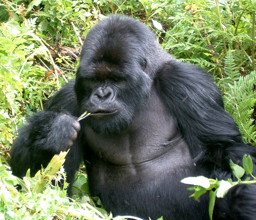

In [5]:
from fastdownload import download_url
dest = 'gorilla.jpg'
download_url(urls[0], dest, show_progress=False)

from fastai.vision.all import *
im = Image.open(dest)
im.to_thumb(256,256)

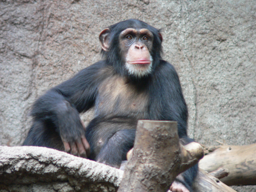

In [6]:
download_url(search_images_ddg('chimpanzee photos', 1)[0], 'chimpanzee.jpg', show_progress=False)
Image.open('chimpanzee.jpg').to_thumb(256,256)

In [7]:
from time import sleep

searches = ['human','gorilla','chimpanzee', 'orangutan']
path = Path('great_apes')

for o in searches:
    dest = (path/o)
    dest.mkdir(exist_ok=True, parents=True)
    download_images(dest, urls=search_images_ddg(f'{o} male photo'))
    sleep(10)  # Pause between searches to avoid over-loading server
    download_images(dest, urls=search_images_ddg(f'{o} female photo'))
    sleep(10)
    download_images(dest, urls=search_images_ddg(f'{o} child photo'))
    sleep(10)
    resize_images(path/o, max_size=400, dest=path/o)

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:975: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [8]:
failed = verify_images(get_image_files(path))
failed.map(Path.unlink)
len(failed)

56

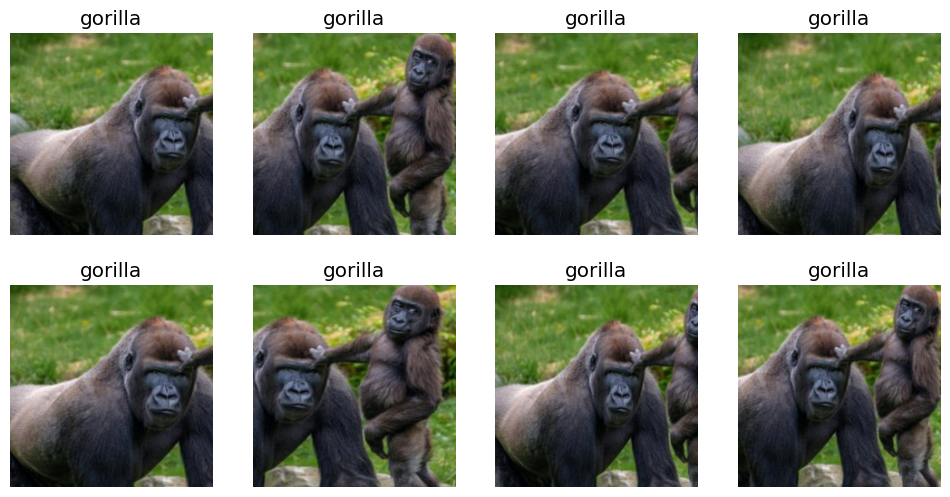

In [9]:
dls = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=RandomResizedCrop(224, min_scale=0.5)
).dataloaders(path, bs=32)

dls.show_batch(max_n=8, nrows=2, unique=True)

In [10]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(5)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 256MB/s]


epoch,train_loss,valid_loss,error_rate,time
0,0.695149,0.230936,0.075893,00:19


epoch,train_loss,valid_loss,error_rate,time
0,0.293606,0.237089,0.064732,00:11
1,0.233349,0.218764,0.055804,00:13
2,0.153700,0.205720,0.042411,00:13
3,0.111850,0.201258,0.049107,00:13
4,0.069324,0.194599,0.046875,00:12


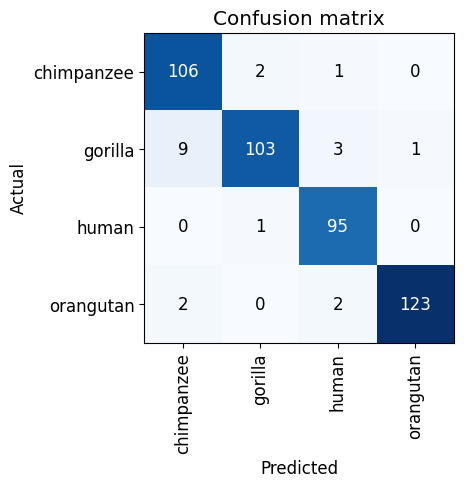

In [11]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

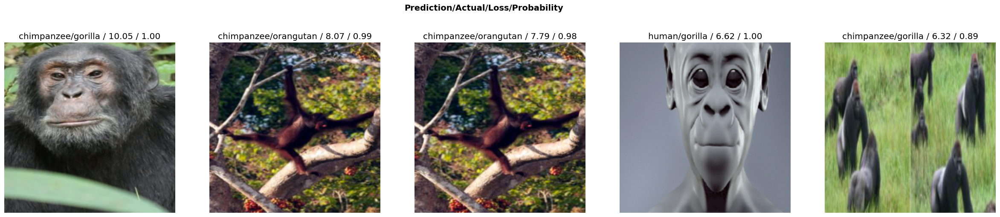

In [15]:
interp.plot_top_losses(5, nrows=1, figsize=(30,6))

In [18]:
from fastai.vision.widgets import *

In [19]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [20]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

In [21]:
dls = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=RandomResizedCrop(224, min_scale=0.5)
).dataloaders(path, bs=32)

In [22]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(5)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


epoch,train_loss,valid_loss,error_rate,time
0,0.690528,0.204244,0.056054,00:13


epoch,train_loss,valid_loss,error_rate,time
0,0.263511,0.139507,0.042601,00:16
1,0.245396,0.149612,0.042601,00:13
2,0.170988,0.099431,0.035874,00:11
3,0.115836,0.090905,0.029148,00:13
4,0.075631,0.097936,0.026906,00:13


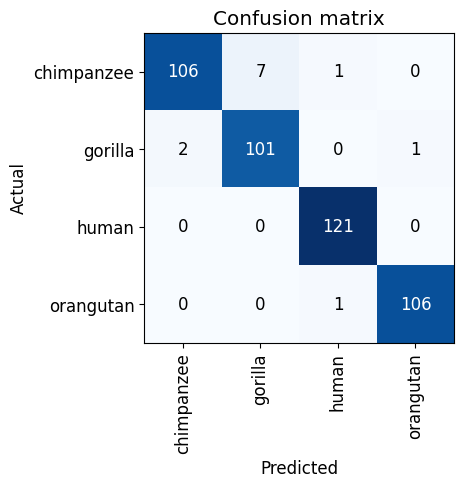

In [23]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

In [27]:
category,_,probs = learn.predict(PILImage.create('chimpanzee.jpg'))
print(f"This is a: {category}.")
print(f"Probability it's a chimpanzee: {probs[0]:.4f}")
print(f"Probability it's a gorilla: {probs[1]:.4f}")
print(f"Probability it's a human: {probs[2]:.4f}")
print(f"Probability it's a orangutan: {probs[3]:.4f}")

This is a: chimpanzee.
Probability it's a chimpanzee: 1.0000
Probability it's a gorilla: 0.0000
Probability it's a human: 0.0000
Probability it's a orangutan: 0.0000


In [28]:
category,_,probs = learn.predict(PILImage.create('gorilla.jpg'))
print(f"This is a: {category}.")
print(f"Probability it's a chimpanzee: {probs[0]:.4f}")
print(f"Probability it's a gorilla: {probs[1]:.4f}")
print(f"Probability it's a human: {probs[2]:.4f}")
print(f"Probability it's a orangutan: {probs[3]:.4f}")

This is a: gorilla.
Probability it's a chimpanzee: 0.0089
Probability it's a gorilla: 0.9910
Probability it's a human: 0.0000
Probability it's a orangutan: 0.0000
